# Predicting the energy supply function for the Italian Electricity market 
## LSTM network implementation

The following is the final model whose results were showed in the final project presentation.

Notice that various slightly different model were implemented and this is only a summary representation

In [125]:
import json
import os
import pandas as pd
import pprint
import time
import numpy as np

%matplotlib inline

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split



from keras.models import Sequential
from keras.layers.core import Dense, Activation, Dropout, Flatten
from keras.layers import TimeDistributed
from keras.layers.recurrent import LSTM
from keras.layers import Dense, Conv1D, MaxPool2D, Flatten, Dropout, GRU, CuDNNLSTM
from keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint
from keras.layers.normalization import BatchNormalization
from keras.optimizers import Adam, SGD, Nadam
from time import time
#!pip install livelossplot
#from livelossplot import PlotLossesKeras
from keras.layers.advanced_activations import LeakyReLU, PReLU

import tensorflow as tf
from tensorflow.python.client import device_lib
from sklearn.preprocessing import StandardScaler


try:
  from pyforest import *
except:
  !pip install pyforest
  from pyforest import *

#gpu test and connection (the experiment was performed on google-colab)
print(tf.test.gpu_device_name())

from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

from keras import backend as K
print(K.tensorflow_backend._get_available_gpus())

/device:GPU:0
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7040705732869407478
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 15808821361524777315
physical_device_desc: "device: XLA_CPU device"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 16488508082818207702
physical_device_desc: "device: XLA_GPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 11329991476
locality {
  bus_id: 1
  links {
  }
}
incarnation: 4108721636413156948
physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"
]
['/job:localhost/replica:0/task:0/device:GPU:0']


The supply functions are sampled over a standard grid of prices, in order to obtain 51 time-series. The predicted point for each of those will be linked together to form the newly predicted Supply function.   Check the slides presentation for further details.

Gets the data, scales in (0,1), create a list of pd.Series(), one for each price on a grid

In [126]:
#from google.colab import files

#uploaded = files.upload()
colab=True
if colab:
  !wget https://gitlab.com/DBertazioli/enercibiddding/raw/master/PyScripts/dumps/TimeSeries_2015_2016.pickle
  #!wget https://gitlab.com/DBertazioli/enercibiddding/raw/master/PyScripts/dumps/q_p_list_2015_2016.pickle

  with open("TimeSeries_2015_2016.pickle", "rb") as infile:
    S=pickle.load(infile)
  !rm TimeSeries_2015_2016.pickle
  
else:
  with open("dumps/q_p_list_2015_2016.pickle", "rb") as infile:
    S=pickle.load(infile)
  
print("len S is ", len(S))
#S1=S[1]
#S1.head()

S_series=[pd.Series(elem) for elem in S]
scaler = MinMaxScaler(feature_range=(0,1))

S=[scaler.fit_transform(S1.values.reshape(-1,1)) for S1 in S_series]
#S=S[:40] #eventually use the whole list
#plt.plot(S1)
#X_train, X_test, y_train, y_test = train_test_split(S1[:-1], S1[1:], test_size=0.33, random_state=None, shuffle=False)

--2019-09-12 17:36:17--  https://gitlab.com/DBertazioli/enercibiddding/raw/master/PyScripts/dumps/TimeSeries_2015_2016.pickle
Resolving gitlab.com (gitlab.com)... 35.231.145.151
Connecting to gitlab.com (gitlab.com)|35.231.145.151|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22388152 (21M) [application/octet-stream]
Saving to: ‘TimeSeries_2015_2016.pickle’

TimeSeries_2015_201 100%[===================>]  21.35M  16.1MB/s    in 1.3s    

2019-09-12 17:36:19 (16.1 MB/s) - ‘TimeSeries_2015_2016.pickle’ saved [22388152/22388152]

len S is  51


In [0]:
#Callback function for online plot while fitting

from IPython.display import clear_output


class TrainingPlot(keras.callbacks.Callback):
    
    # This function is called when the training begins
    def on_train_begin(self, logs={}):
        # Initialize the lists for holding the logs, losses and accuracies
        self.losses = []
        self.acc = []
        self.val_losses = []
        self.val_acc = []
        self.logs = []
    
    # This function is called at the end of each epoch
    def on_epoch_end(self, epoch, logs={}):
        
        n_step=50
        # Append the logs, losses and accuracies to the lists
        self.logs.append(logs)
        self.losses.append(logs.get('loss'))
        self.acc.append(logs.get('acc'))
        self.val_losses.append(logs.get('val_loss'))
        self.val_acc.append(logs.get('val_acc'))
        
        # Before plotting ensure at least 2 epochs have passed
        if len(self.losses)%n_step==0:
            
            %matplotlib inline
            # Clear the previous plot
            clear_output(wait=True)
            N = np.arange(0, len(self.losses))
            
            # You can chose the style of your preference
            # print(plt.style.available) to see the available options
            plt.style.use("seaborn")
            
            # Plot train loss, train acc, val loss and val acc against epochs passed
            plt.figure()
            plt.plot(N, self.losses, label = "train_loss")
            plt.plot(N, self.acc, label = "train_acc")
            plt.plot(N, self.val_losses, label = "val_loss")
            plt.plot(N, self.val_acc, label = "val_acc")
            plt.title("Training Loss and Accuracy [Epoch {}]".format(epoch+1))
            plt.xlabel("Epoch #")
            plt.ylabel("Loss/Accuracy")
            plt.legend()
            plt.show()

plot_losses = TrainingPlot()

Data preparation in order to fit the expected input format of a standard LSTM implementation.

The initial time series are split into almost overlapping (one-lag shifted) subsequences.

In [0]:
def split_multi_sequence(seq_list, n_steps, n_target_serie, mode="adj"):
    main_X, main_y, X, y = list(), list(), list(),list()
    target_seq=seq_list[n_target_serie]
    append=True
    if mode=="weekly":
      offset=24
    elif mode=="daily":
      offset=2
    else:
      offset=0
    for i in range(len(target_seq)-(168+offset)):
        X=[]
        y=[]
        for sequence in seq_list:
            if mode=="daily":
              seq_x=[]
              seq_x.append(sequence[i])
              seq_x.append(sequence[i+144])
              seq_x.append(sequence[i+166])             
              seq_x.append(sequence[i+167])
              end_ix=i + 168+1
              seq_y=sequence[end_ix]
          
            if mode=="weekly":
              seq_x=[]
              seq_x.append(sequence[i])
              seq_x.append(sequence[i+144])
              seq_x.append(sequence[i+166])             
              seq_x.append(sequence[i+167])
              end_ix=i + 168+24
              seq_y=sequence[end_ix]
            
            elif mode=="custom":
              #seq_x=np.append(sequence[i],sequence[i+144],sequence[i+167])
              seq_x=[]
              seq_x.append(sequence[i])
              seq_x.append(sequence[i+144])
              seq_x.append(sequence[i+166])             
              seq_x.append(sequence[i+167])
             
              #[seq_x.append(sequence[i + j]) for j in range(168-24,168)]
              end_ix=i + 168
              seq_y=sequence[end_ix]
            elif mode=="adj":
              # find the end of this pattern
              end_ix = i + n_steps
              seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
            
            # check if we are beyond the sequence
            if end_ix > len(sequence)-1:
                append=False
                break
            else:
                append=True
            
            X.append(np.array(seq_x))
            y.append(seq_y)
        if append==True:
            main_X.append(np.array(X))
            main_y.append(y)
    #return np.array(X), np.array(y)
    return main_X, main_y

In [0]:
#just a support function for easy reshaping data 
def shaper(X):
    arr=np.ndarray(shape=(len(X),X[0].shape[1],X[0].shape[0]))
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            for k in range(arr.shape[2]):
                    try:
                        arr[i][j][k]=X[i][k][j]
                    except Exception as e:
                        print(e)
                        print(i,j,k)
                        #break
    return arr

Each one of the 51 time series is composed by ~1.4k time intervals

In [130]:
len(S[1])

14160

"custom" mode: 1h prediction using t-1, t-24 and t-168 lags

"daily" mode: 24h prediction

"weekly" mode: 168h prediction

In [0]:
# choose a number of time steps
n_target_serie=0 #dummy, used in another implementation for univariate prediction
up_to=-1000 #train/test splitting param
mode="custom"
if mode in ["custom", "weekly", "daily"]:
  n_steps=4
else:
  n_steps = 168  

# split into samples
X, y = split_multi_sequence([elem[:up_to] for elem in S], n_steps,n_target_serie, mode=mode)

n_features = len(S)
# train data shaping
X=shaper(X)
# y-shaping is straightforward
y=np.array(y)
y=y.reshape(y.shape[0],y.shape[1])

# test data shaping 
Xt, yt=split_multi_sequence([elem[up_to:] for elem in S], n_steps, n_target_serie, mode=mode)
  
Xt=shaper(Xt)

In [0]:
X.shape

(12992, 4, 51)

some horrible workaround for net-connection problem while saving from colab

In [0]:
custom_model_name="LSTM_multivar_multidim_2015_good_timestep_168_0cycle_10000ep_512b"

load=False
colab=True
if load:
    from keras.models import model_from_json
    
    if colab:
        from google.colab import files
        files.upload()
        model_name=custom_model_name
    else:
      model_name="lstm_models/LSTM_multivar_multidim_2015_goo_timestep_168_0cycle_10000ep_512b"
    model_weights=model_name+"_weigths.h5.csv"

    json_file = open(model_name+".json", 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    # load weights into new model
    loaded_model.load_weights(model_weights)
    print("Loaded model from disk")

    recompile=False
    if recompile:
      loaded_model.compile(loss='mse', optimizer="adam")
      model=loaded_model

In [0]:
#support function for better visualizing a single time series
def unwind_y(arr_y, n_target_feature=0):
    return np.array([e[n_target_feature] for e in arr_y])

Model evaluation is performed via both validation split prassi and via RMSE score on the test set

In [0]:
import math
def anti_transform(y):
  main_y_list=[]
  for y_price in y:    
    y_list=[]
    y_list.append(math.exp(y_price[0]+np.std(y_price[0])))
    #for i in range(1,len(y_price)):
    #  y_list.append(math.exp(y_price[i]+np.std(y_price[i]))+y_list[i-1]-1)
    [y_list.append(math.exp(y_price[i]+np.std(y_price[i]))+y_list[i-1]-1) for i in range(1,len(y_price))]
    main_y_list.append(np.array(y_list))
  return np.array(main_y_list)

def calc_rmse(model, X, y_real, scaler=scaler, anti_transform=anti_transform, log=False):
  y_pred=model.predict(X[:], verbose=0)
  y_real=np.array(y_real)
  y_real=y_real.reshape(y_real.shape[0],y_real.shape[1])
  if not log:
    y_pred_t=scaler.inverse_transform(y_pred)
    y_real_t=scaler.inverse_transform(y_real)
  else:
    y_pred_t=anti_transform(scaler.inverse_transform(y_pred))
    y_real_t=anti_transform(scaler.inverse_transform(y_real))
  
  return np.sqrt(np.mean(np.power(y_real_t-y_pred_t,2))), 100*np.mean(np.abs((y_real_t-y_pred_t)/y_real_t))

### Model definition 

(slightly (and not-slightly) different models were tested as well, this is just the one we choose to show in the presentation)

the 3rd layer is supposed to be a sort of information bottleneck reproducing the reduced rank effect experimented with our  statistical approach.

In [0]:
look_back=n_steps
define=True
if define:
  
  def create_model(look_back, rank, reg=True):
      model = Sequential()
      model.add(CuDNNLSTM(500, input_shape=(look_back, n_features), return_sequences=True, kernel_initializer='TruncatedNormal'))
      if reg:
        model.add(BatchNormalization())
      model.add(LeakyReLU())
      if reg:
        model.add(Dropout(rate=0.1))

      #1
      for _ in range(1):
          model.add(CuDNNLSTM(200, kernel_initializer='TruncatedNormal', return_sequences=True))
          if reg:
            model.add(BatchNormalization())
          model.add(LeakyReLU())
          if reg:
            model.add(Dropout(rate=0.1))   

      #2
      for _ in range(1):
        model.add(CuDNNLSTM(50, kernel_initializer='TruncatedNormal', return_sequences=False))
        if reg:
          model.add(BatchNormalization())
        model.add(LeakyReLU())
        if reg:
          model.add(Dropout(rate=0.1))

      #3
      for _ in range(1):
          model.add(Dense(rank))
          if reg:
            model.add(BatchNormalization())
          model.add(LeakyReLU())
          if reg:
            model.add(Dropout(rate=0.1))
      #3
      for _ in range(1):
          model.add(Dense(128))
          if reg:
            model.add(BatchNormalization())
          model.add(LeakyReLU())
          if reg:
            model.add(Dropout(rate=0.1))
      #4
      for _ in range(1):
          model.add(Dense(256, kernel_initializer='TruncatedNormal'))
          if reg:
            model.add(BatchNormalization())
          model.add(LeakyReLU())
          if reg:
            model.add(Dropout(rate=0.1))

      #5
      model.add(Dense(n_features))

      return model

  



In [0]:
model1=create_model(n_steps, 30)
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)
# compile & fit
model1.compile(optimizer='adam', loss = ['mse'], metrics=["mae", 'mse'])




Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



In [0]:
rmse_list=[]

In [0]:
range_list=[i*5 for i in range(1,11)]
range_list.append(100)
range_list

[5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 100]

Epoch 00213: early stopping
rmse/mape at rank 5:	(1358.6134415429112, 3.79914804803641)
Epoch 00246: early stopping
rmse/mape at rank 10:	(1335.9183821527429, 3.66875486293491)
Epoch 00360: early stopping
rmse/mape at rank 15:	(1287.7956094310684, 3.48637424960309)
Epoch 00375: early stopping
rmse/mape at rank 20:	(1251.3354441076017, 3.42614997079083)
Epoch 00253: early stopping
rmse/mape at rank 25:	(1329.5139355668102, 3.591617782488344)
Epoch 00279: early stopping
rmse/mape at rank 30:	(1258.9500138030915, 3.4495993875422077)
Epoch 00422: early stopping
rmse/mape at rank 35:	(1276.5351441681998, 3.491038189798791)
Epoch 00207: early stopping
rmse/mape at rank 40:	(1267.4829804022295, 3.5817135548418944)
Epoch 00204: early stopping
rmse/mape at rank 45:	(1260.3991326057212, 3.476937649313569)
Epoch 00264: early stopping
rmse/mape at rank 50:	(1192.501521058095, 3.250529854654962)
Epoch 00313: early stopping
rmse/mape at rank 51:	(1279.6890993874265, 3.5948640108441405)


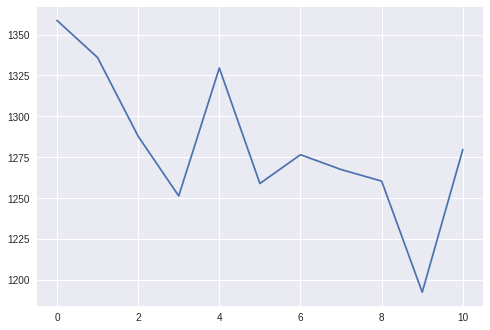

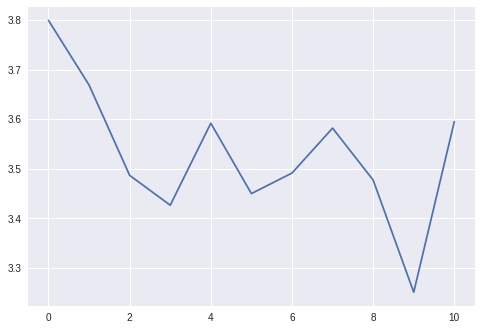

In [0]:
for rank in range_list:
  model1=create_model(n_steps, rank)
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)
  # compile & fit
  model1.compile(optimizer='adam', loss = ['mse'], metrics=["mae", 'mse'])
  model1.fit(X, y, epochs=1000, batch_size=1024, verbose=0, validation_split=0.2, callbacks=[es])
  rmse=calc_rmse(model1, Xt, yt, log=False)
  print("rmse/mape at rank {}:\t{}".format(rank, rmse))
  rmse_list.append(rmse)
  
plt.plot([elem[0] for elem in rmse_list])
plt.show()
plt.plot([elem[1] for elem in rmse_list])


Epoch 00204: early stopping
rmse/mape at rank 5:	(1281.722885371605, 3.2306792441974297)
Epoch 00120: early stopping
rmse/mape at rank 10:	(2025.3469870428855, 5.289307743988493)
Epoch 00147: early stopping
rmse/mape at rank 15:	(1413.8102952245026, 3.6583400275346687)
Epoch 00207: early stopping
rmse/mape at rank 20:	(1301.9372764090033, 3.228803813835686)
Epoch 00200: early stopping
rmse/mape at rank 25:	(1280.7917213725186, 3.2601875480443416)
Epoch 00218: early stopping
rmse/mape at rank 30:	(1249.9385211862837, 3.164739242656244)
Epoch 00208: early stopping
rmse/mape at rank 35:	(1156.02188438751, 3.0173392049925423)
Epoch 00159: early stopping
rmse/mape at rank 40:	(1726.2893596270853, 4.222087794158044)
Epoch 00200: early stopping
rmse/mape at rank 45:	(1193.8493102616612, 3.150694282509271)
Epoch 00345: early stopping
rmse/mape at rank 50:	(1259.6410176845254, 3.304225906616575)
Epoch 00336: early stopping
rmse/mape at rank 51:	(1242.6405541005408, 3.118187559082539)


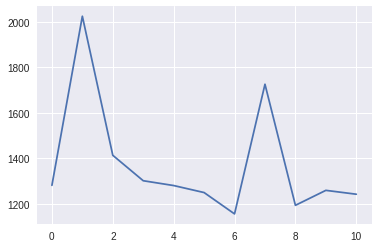

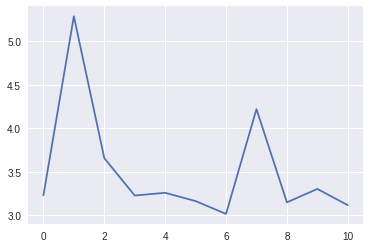

In [0]:
for rank in range_list:
  model1=create_model(n_steps, rank)
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)
  # compile & fit
  model1.compile(optimizer='adam', loss = ['mae'], metrics=["mae", 'mse'])
  model1.fit(X, y, epochs=1000, batch_size=1024, verbose=0, validation_split=0.2, callbacks=[es])
  rmse=calc_rmse(model1, Xt[:100], yt[:100], log=False)
  print("rmse/mape at rank {}:\t{}".format(rank, rmse))
  rmse_list.append(rmse)
  
plt.plot([elem[0] for elem in rmse_list])
plt.show()
plt.plot([elem[1] for elem in rmse_list])


Epoch 00221: early stopping
rmse/mape at rank 5:	(1169.7845524021388, 3.1418186245941575)
Epoch 00252: early stopping
rmse/mape at rank 10:	(1089.56862121179, 2.9457153267119343)
Epoch 00241: early stopping
rmse/mape at rank 15:	(1151.602642124223, 3.150434611274559)
Epoch 00370: early stopping
rmse/mape at rank 20:	(1325.4889743444876, 3.5459900633380994)
Epoch 00260: early stopping
rmse/mape at rank 25:	(1232.5040435743788, 3.4125063417955555)
Epoch 00243: early stopping
rmse/mape at rank 30:	(1277.1405807113463, 3.4064417296369403)
Epoch 00341: early stopping
rmse/mape at rank 35:	(1074.851380789023, 2.845769627064772)
Epoch 00367: early stopping
rmse/mape at rank 40:	(1120.3720465313022, 3.0509053095083396)
Epoch 00293: early stopping
rmse/mape at rank 45:	(1157.6704501689442, 3.066142291681553)
Epoch 00252: early stopping
rmse/mape at rank 50:	(1246.248437243555, 3.4300783875589484)
Epoch 00293: early stopping
rmse/mape at rank 100:	(1410.0107413252038, 3.7173418423211)


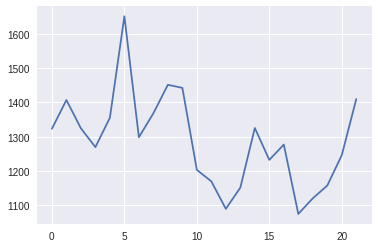

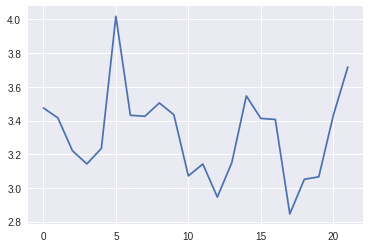

In [0]:
for rank in range_list:
  model1=create_model(n_steps, rank)
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)
  # compile & fit
  model1.compile(optimizer='adam', loss = ['mse'], metrics=["mae", 'mse'])
  model1.fit(X, y, epochs=1000, batch_size=1024, verbose=0, validation_split=0.2, callbacks=[es])
  rmse=calc_rmse(model1, Xt[-100:], yt[-100:], log=False)
  print("rmse/mape at rank {}:\t{}".format(rank, rmse))
  rmse_list.append(rmse)
  
plt.plot([elem[0] for elem in rmse_list])
plt.show()
plt.plot([elem[1] for elem in rmse_list])


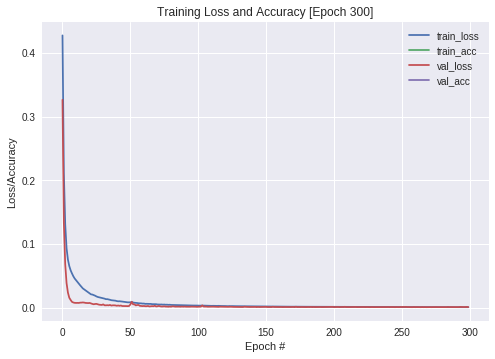

Epoch 301/1000
 - 1s - loss: 8.5500e-04 - mean_absolute_error: 0.0223 - mean_squared_error: 8.5500e-04 - val_loss: 0.0010 - val_mean_absolute_error: 0.0241 - val_mean_squared_error: 0.0010
Epoch 302/1000
 - 1s - loss: 8.4041e-04 - mean_absolute_error: 0.0221 - mean_squared_error: 8.4041e-04 - val_loss: 0.0011 - val_mean_absolute_error: 0.0254 - val_mean_squared_error: 0.0011
Epoch 303/1000
 - 1s - loss: 8.5648e-04 - mean_absolute_error: 0.0223 - mean_squared_error: 8.5648e-04 - val_loss: 0.0011 - val_mean_absolute_error: 0.0251 - val_mean_squared_error: 0.0011
Epoch 304/1000
 - 1s - loss: 8.4633e-04 - mean_absolute_error: 0.0223 - mean_squared_error: 8.4633e-04 - val_loss: 0.0014 - val_mean_absolute_error: 0.0281 - val_mean_squared_error: 0.0014
Epoch 305/1000
 - 1s - loss: 8.4939e-04 - mean_absolute_error: 0.0224 - mean_squared_error: 8.4939e-04 - val_loss: 0.0012 - val_mean_absolute_error: 0.0257 - val_mean_squared_error: 0.0012
Epoch 306/1000
 - 1s - loss: 8.5975e-04 - mean_absolute

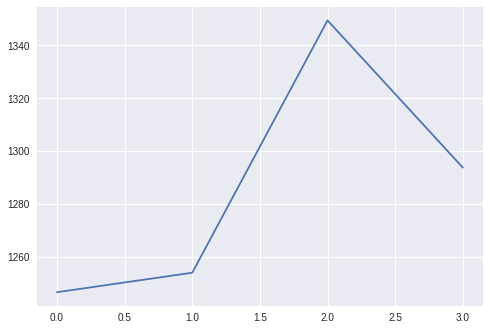

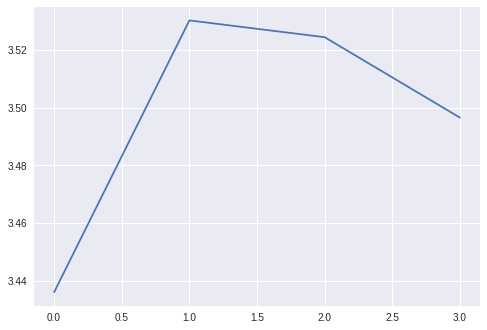

In [0]:
for rank in [50]:
  print(rank)
  model2=create_model(n_steps, rank)
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)
  # compile & fit
  model2.compile(optimizer='adam', loss = ['mse'], metrics=["mae", 'mse'])
  model2.fit(X, y, epochs=1000, batch_size=1024, verbose=2, validation_split=0.2, callbacks=[es, plot_losses])
  #y_pred_scaled=model.predict
  rmse=calc_rmse(model2, Xt, yt, log=False)
  print("rmse/mape at rank {}:\t{}".format(rank, rmse))
  rmse_list.append(rmse)
  
plt.plot([elem[0] for elem in rmse_list])
plt.show()
plt.plot([elem[1] for elem in rmse_list])

In [0]:
model1.summary()
history_list=[]

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
cu_dnnlstm_6 (CuDNNLSTM)     (None, 3, 128)            81920     
_________________________________________________________________
batch_normalization_8 (Batch (None, 3, 128)            512       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 3, 128)            0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 3, 128)            0         
_________________________________________________________________
cu_dnnlstm_7 (CuDNNLSTM)     (None, 3, 64)             49664     
_________________________________________________________________
batch_normalization_9 (Batch (None, 3, 64)             256       
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 3, 64)            

In [0]:
# support function for saving
def save_to_disk(model1, cycle, colab=True, epochs=10000, batch=512):
  
  from keras.models import model_from_json
  if colab:
    model_name="LSTM_multivar_multidim_2015_good_timestep_168_"+str(cycle)+"cycle_"+str(epochs)+"ep_"+str(batch)+"b"
  else:
    model_name="lstm_models/LSTM_multivar_multidim_2015_bigger_timestep_168_"+str(cycle)+"cycle_"+str(epochs)+"ep_"+str(batch)+"b"
  model_weights=model_name+"_weigths.h5.csv"
  # serialize model to JSON
  model_json = model1.to_json()
  with open(model_name+".json", "w") as json_file:
      json_file.write(model_json)
  # serialize weights to HDF5
  model1.save_weights(model_weights)
  print("Saved model to disk")

  if colab:
      from google.colab import files
      files.download(model_name+".json")
      files.download(model_weights)


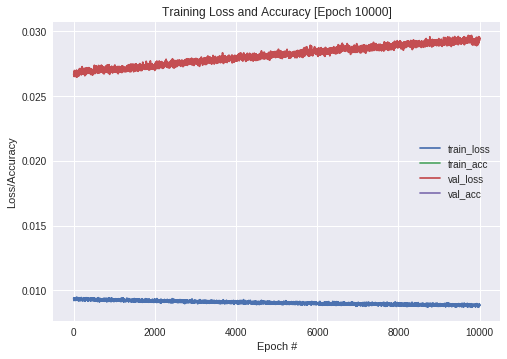

In [0]:
#just an attempt of extreme overfitting: the performace on the test set were not extremely different from those trained with early stopping: need more data!
history=model1.fit(X, y, epochs=10000, batch_size=1024, verbose=0, validation_split=0.2, callbacks=[plot_losses]) 

#1 cycle of 10000 
##saved weights




still, some terrible workaround to prevent buggy download (direct download is a messy of network problems)from google colab.

In [0]:
cycle=1
try:
    print("saving model to disk at cycle ", cycle )
    save_to_disk(model1, cycle)
    print("model saved")
except Exception as e:
    print(e)
    print("trying again")
    try:
      save_to_disk(model1, cycle)
      print("model saved after trying again")
    except:
      print("passing")
      pass
  #history_list.append(history)

saving model to disk at cycle  1
Saved model to disk
model saved


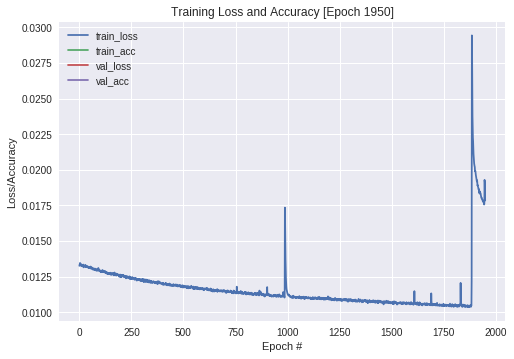

In [0]:
history=model1.fit(X, y, epochs=10000, batch_size=512, verbose=0, callbacks=[plot_losses])


Some example of fitting on the test set

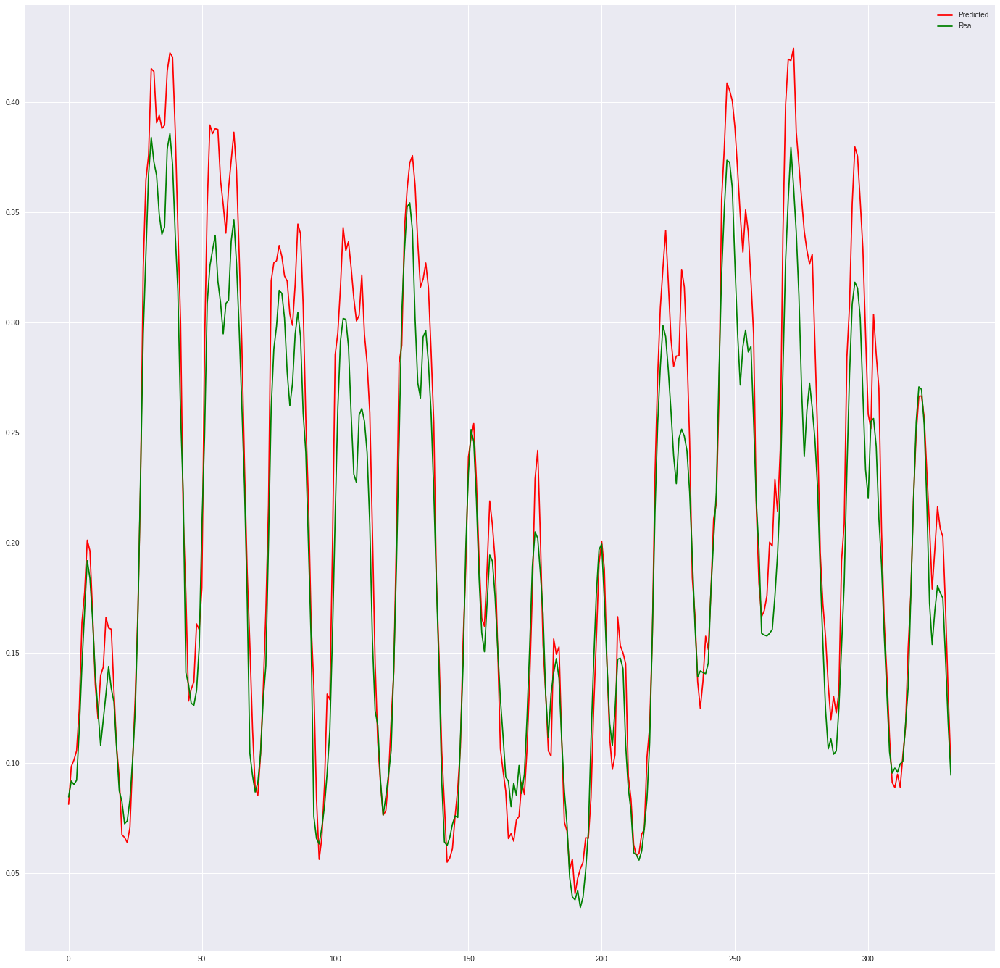

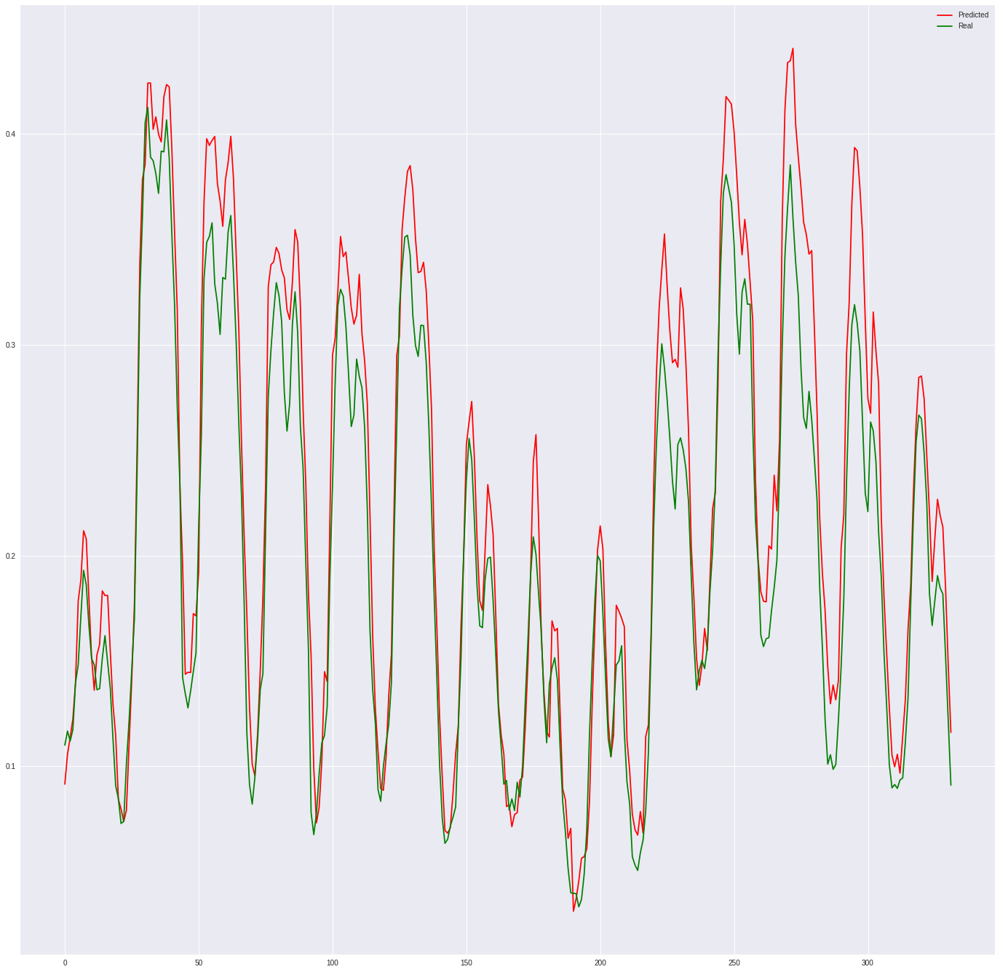

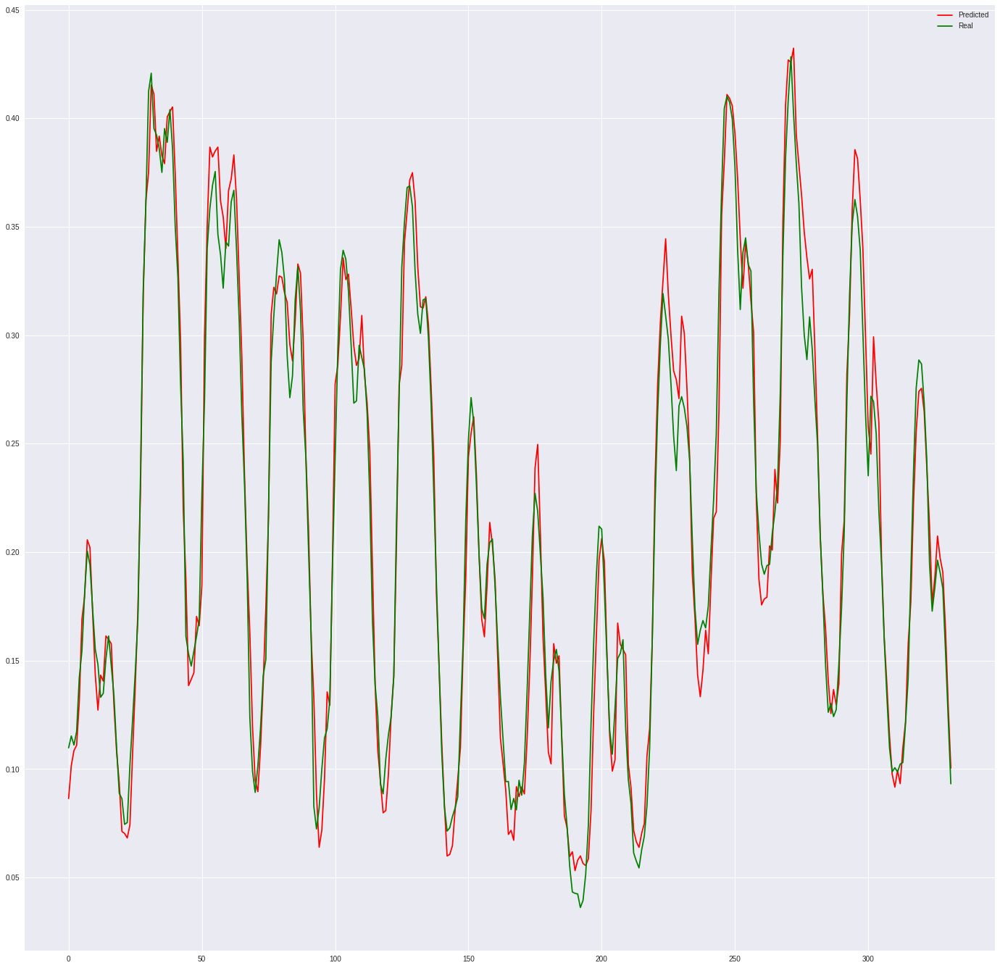

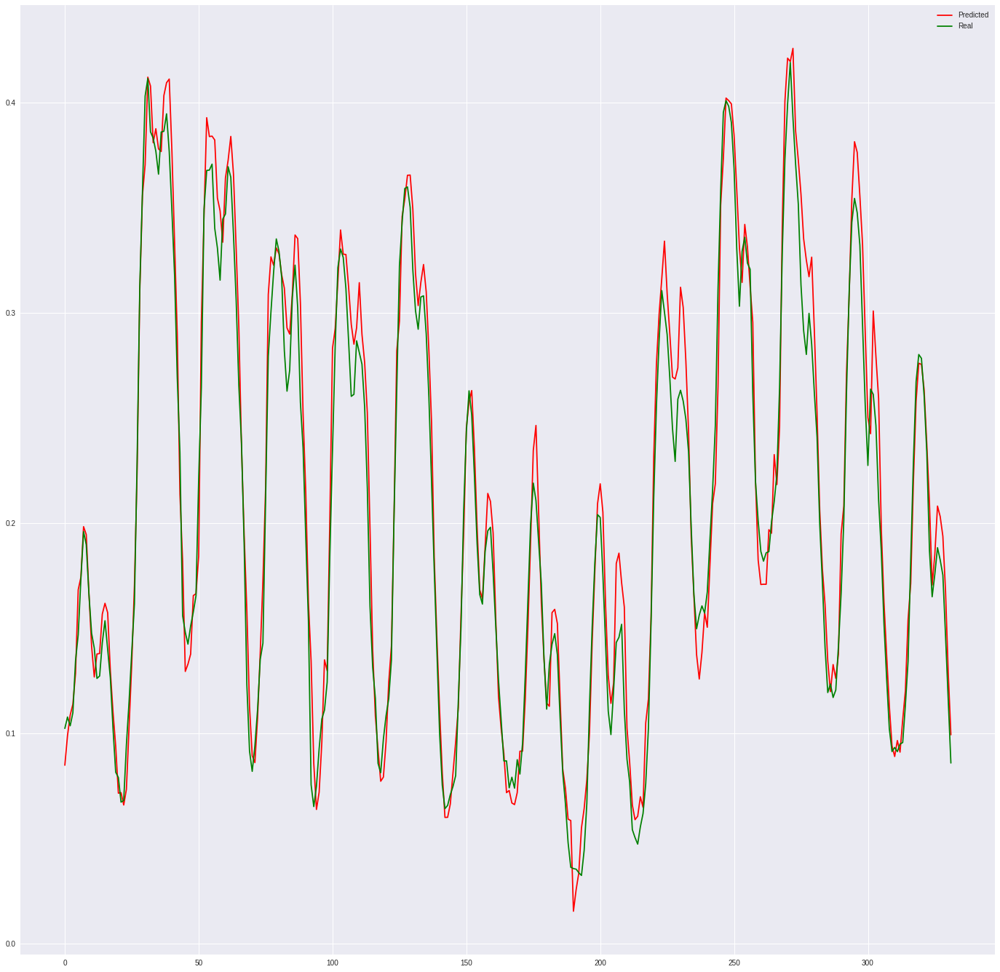

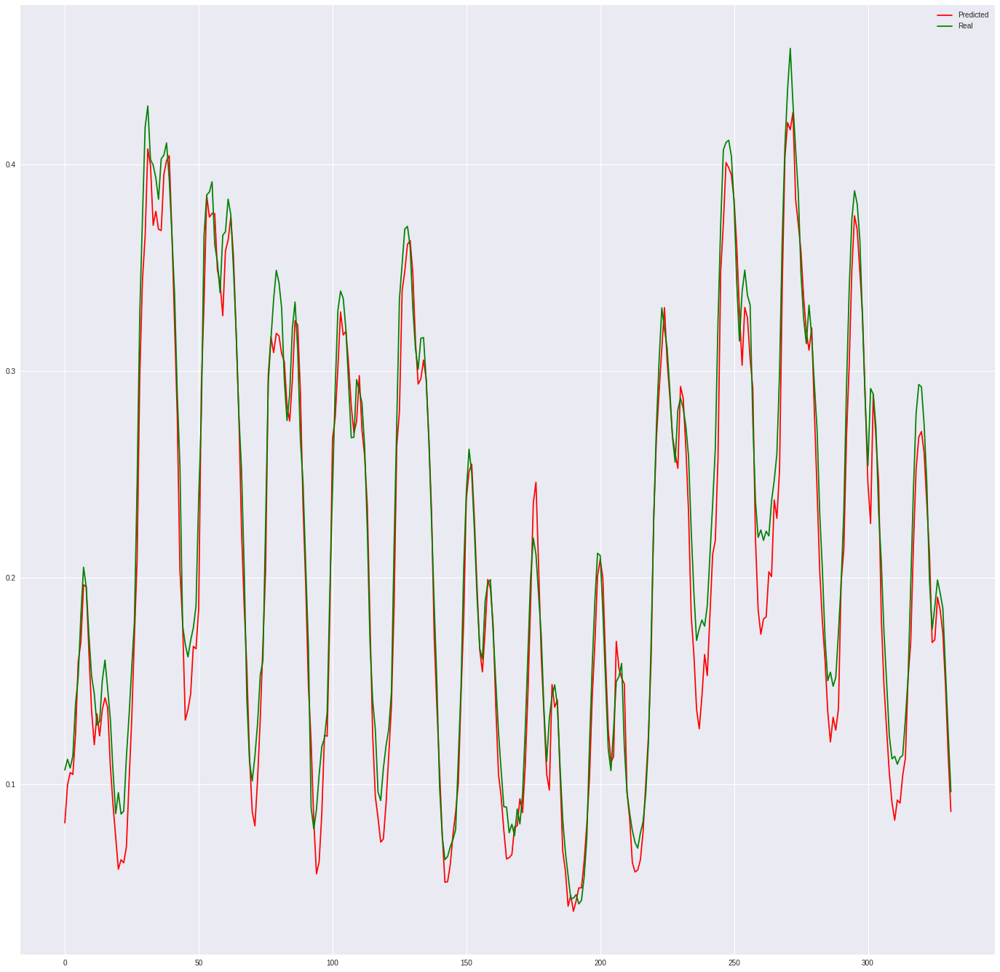

...

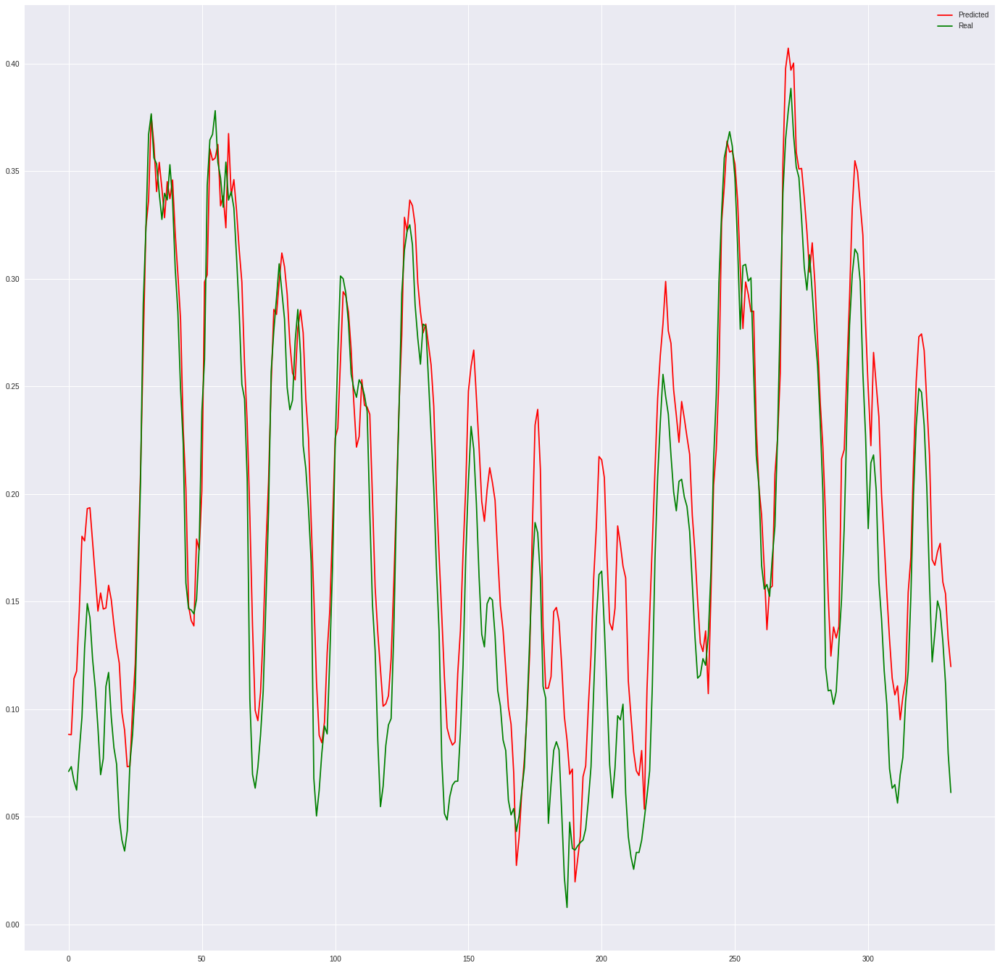

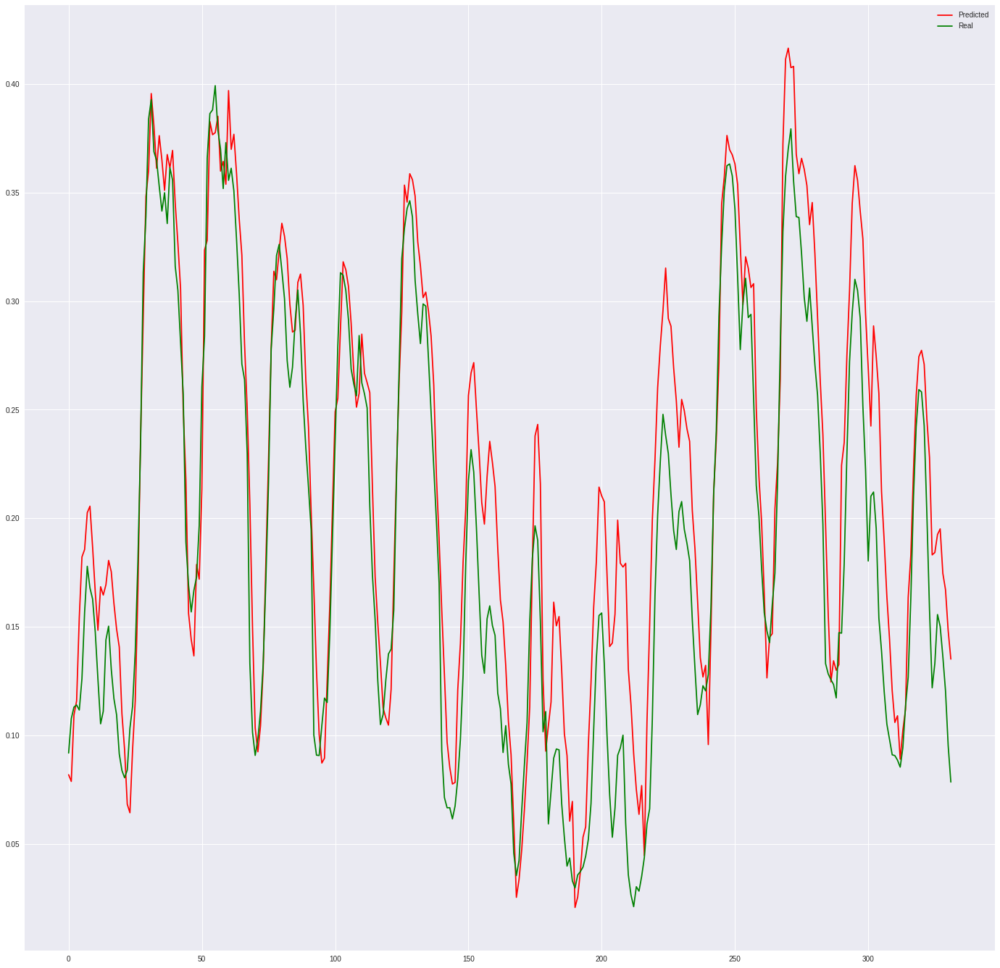

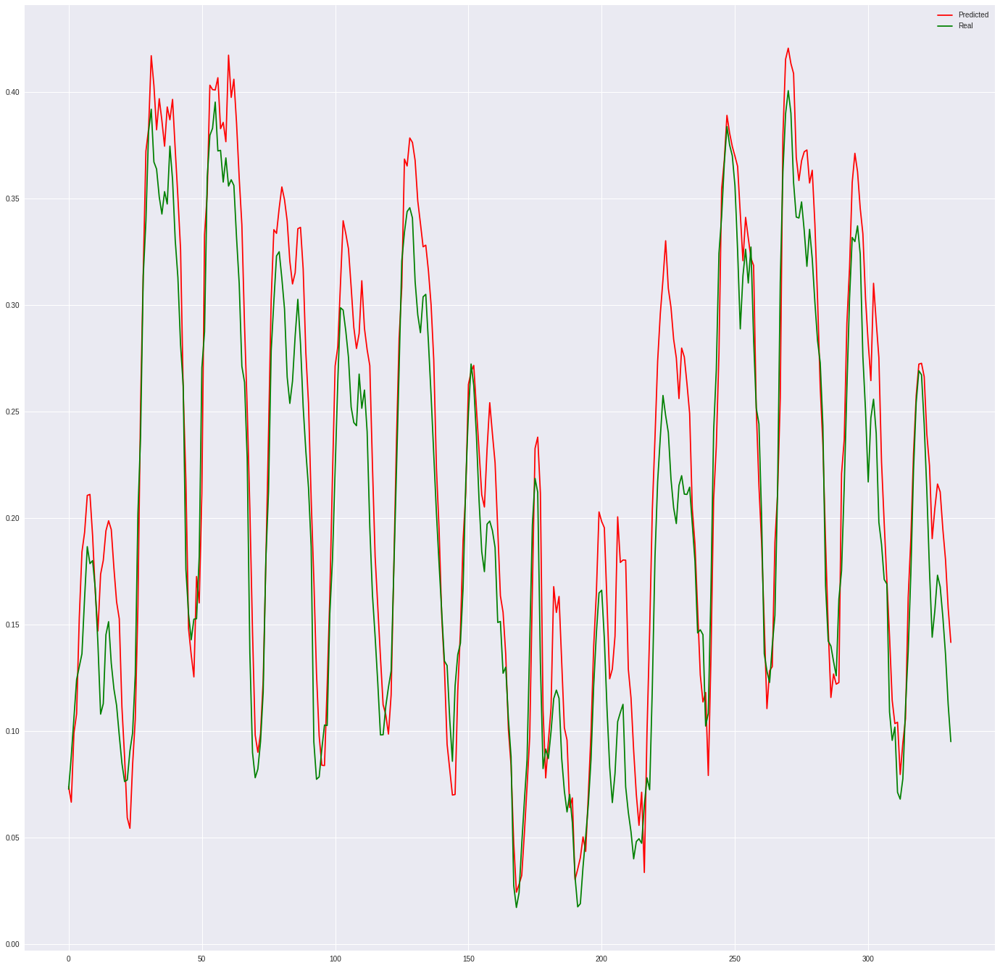

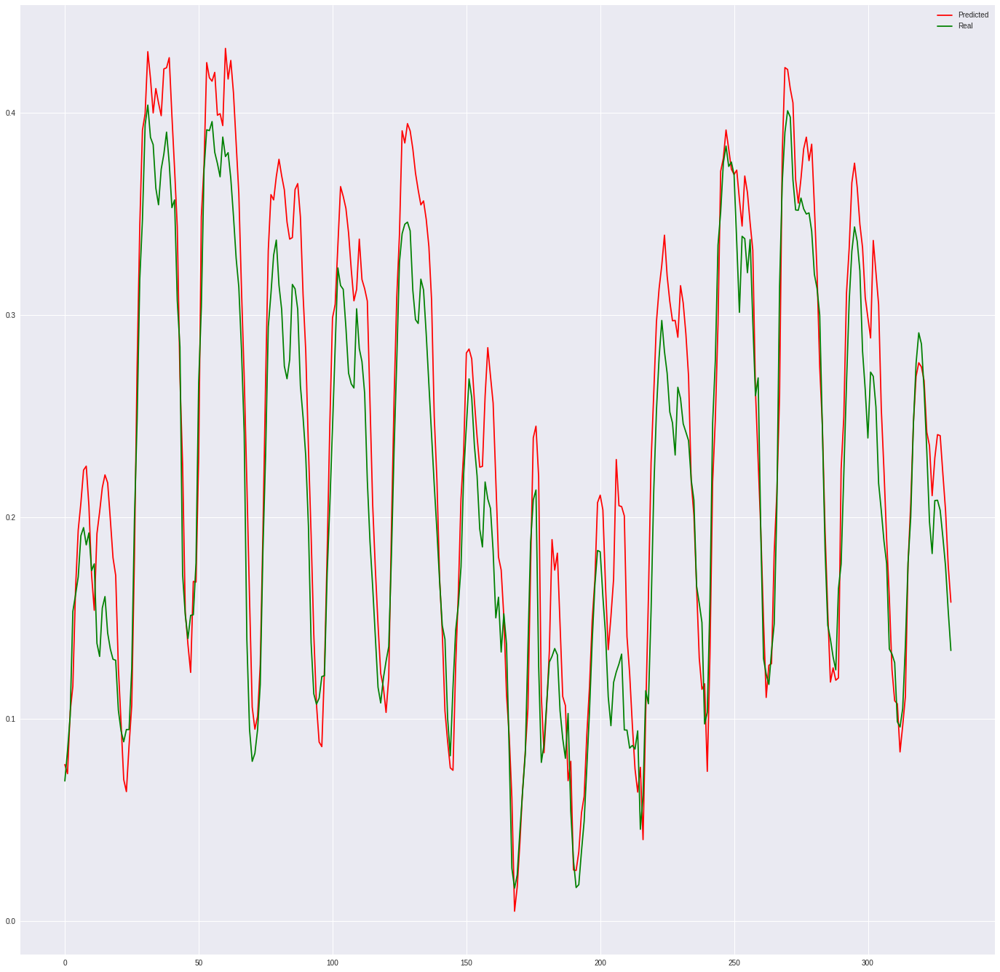

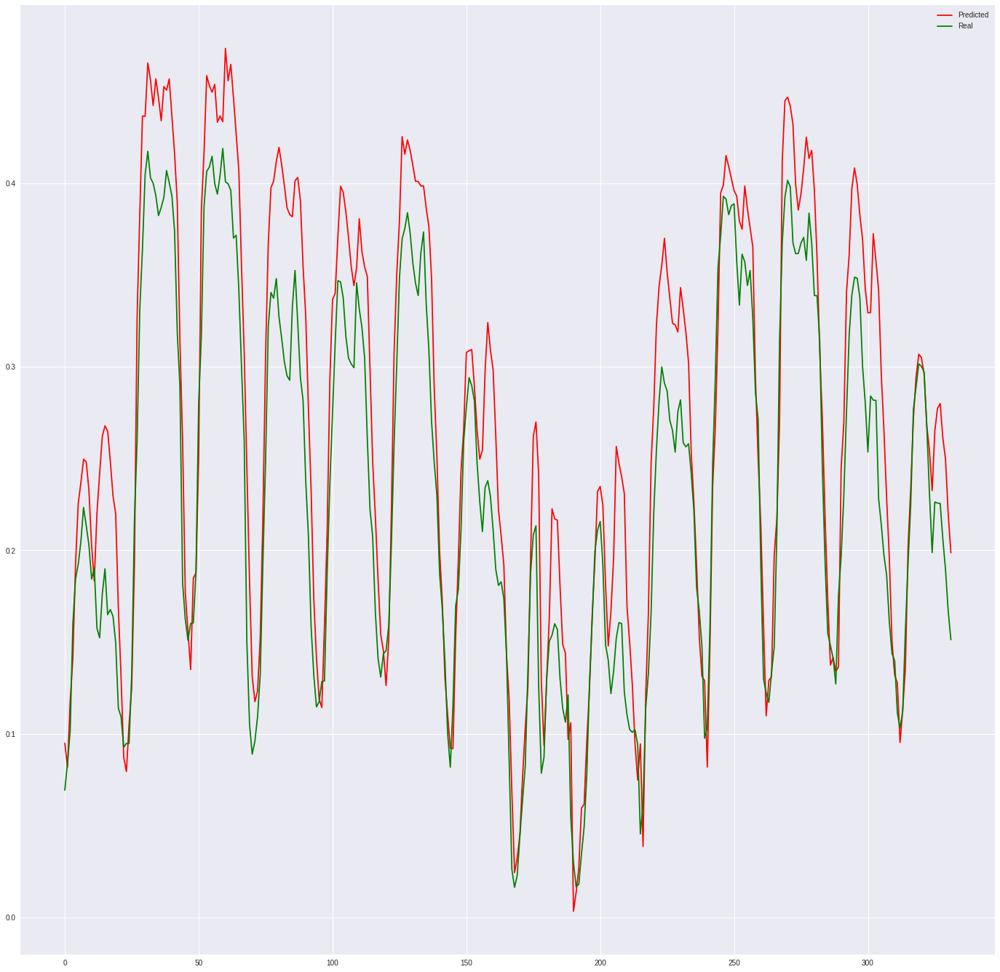

KeyboardInterrupt: ignored

In [0]:
for target_feature in range(y.shape[1]):
    
    ypt = unwind_y(model1.predict(Xt[:], verbose=0), target_feature)
    yrt = unwind_y(yt[:],target_feature)


    yp = unwind_y(model1.predict(X[50:100], verbose=0),target_feature)
    yr = unwind_y(y[50:100],target_feature)

    %matplotlib inline
    plt.figure(figsize=(24,24))
    n=100

    multi=False
    if multi:
        for i in range(10):
            plt.plot(yp[i], color= 'red', label="Predicted")
            plt.plot(yr[i], color='green', label="Real")
    else:
        plt.plot(ypt, color= 'red', label="Predicted")
        plt.plot(yrt, color='green', label="Real")
        #plt.plot(range(len(yp),len(yp)+len(ypt)),ypt,color="red", label="TPredicted")
        #plt.plot(range(len(yp),len(yp)+len(yrt)),yrt,color="green",  label="TReal")

    #plt.plot(X[50:100,n_steps-1], color='blue', label="Lagged-0")
    #plt.plot(Xt[:5,n_steps-1], color='blue', label="Lagged-0")

    plt.legend()
    plt.show()

examples of overfitting the train set

one should either regularize, or reduce the net capability (less neurons and less layers) or ideally have more data (that would be great)

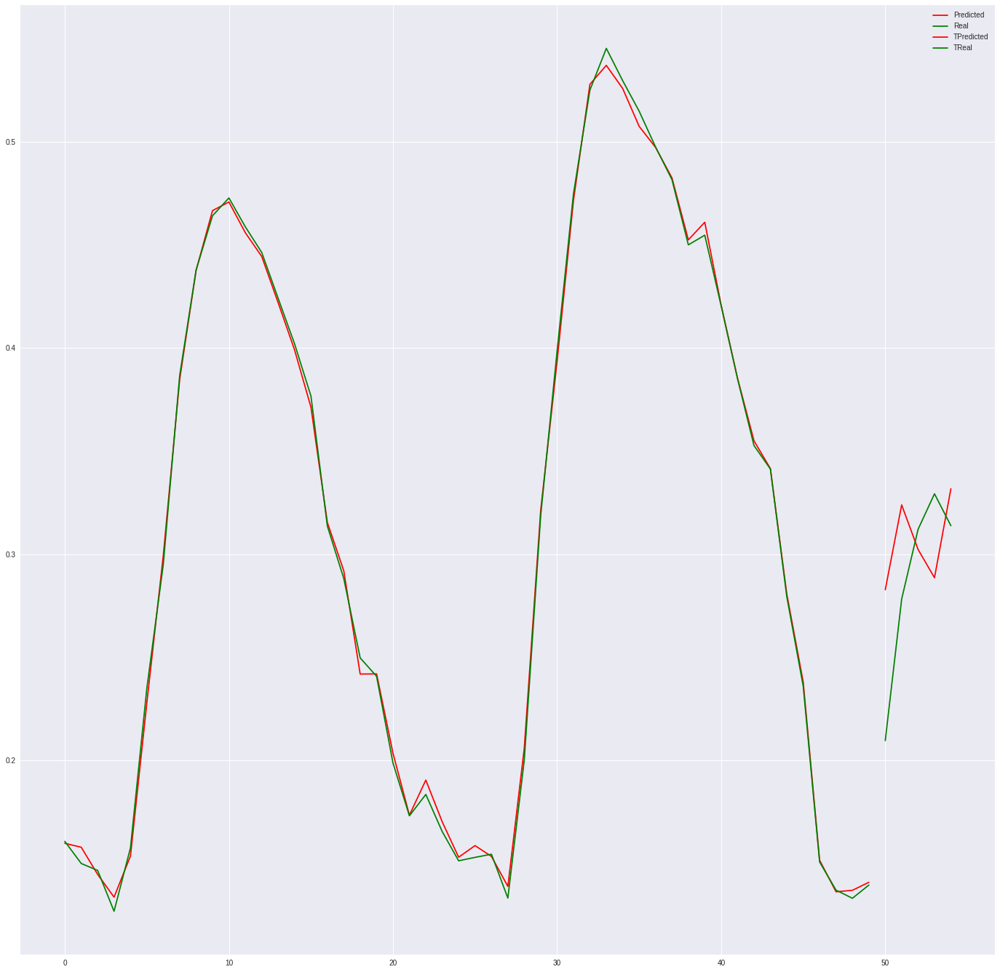

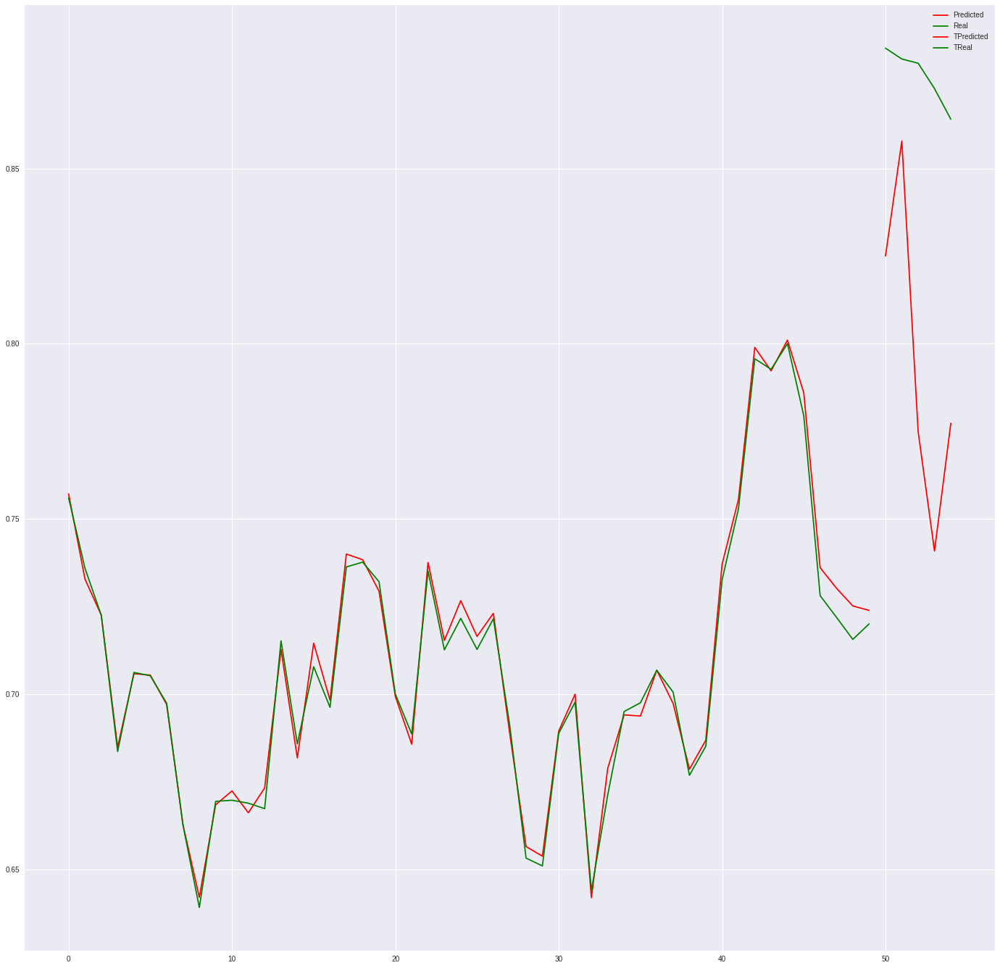

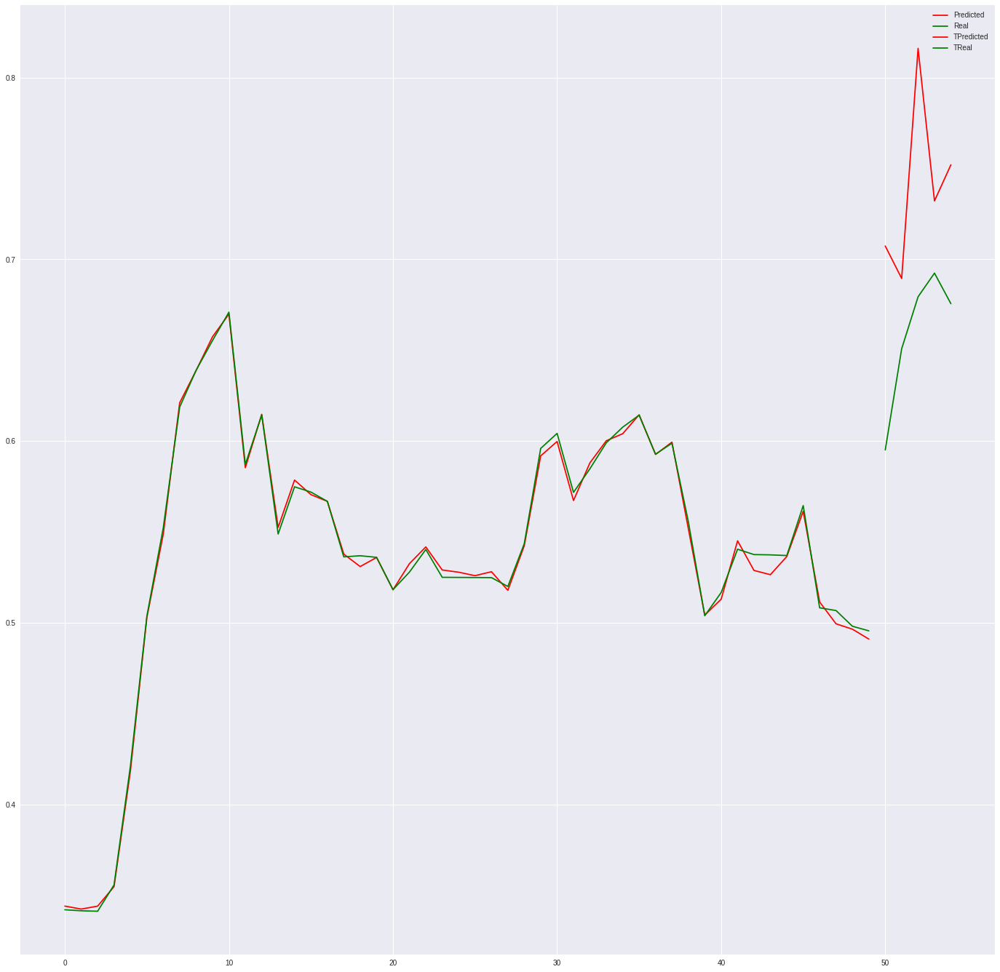

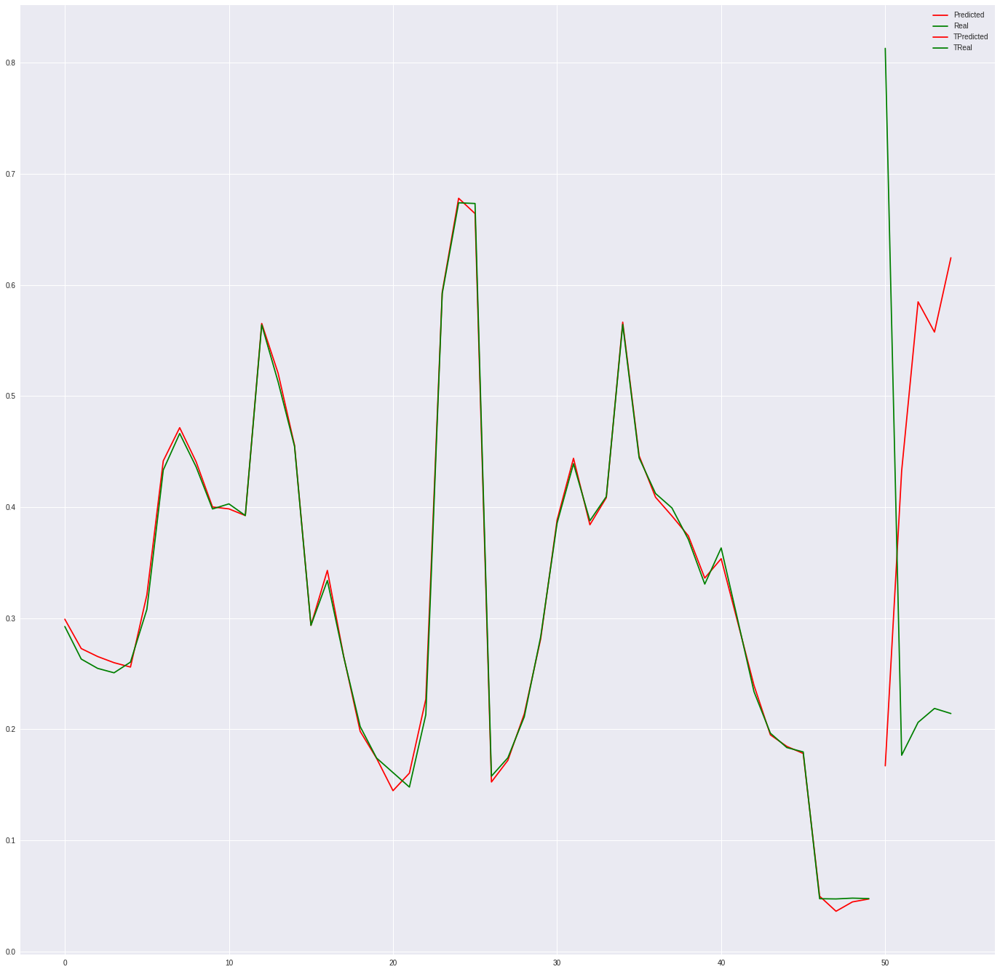

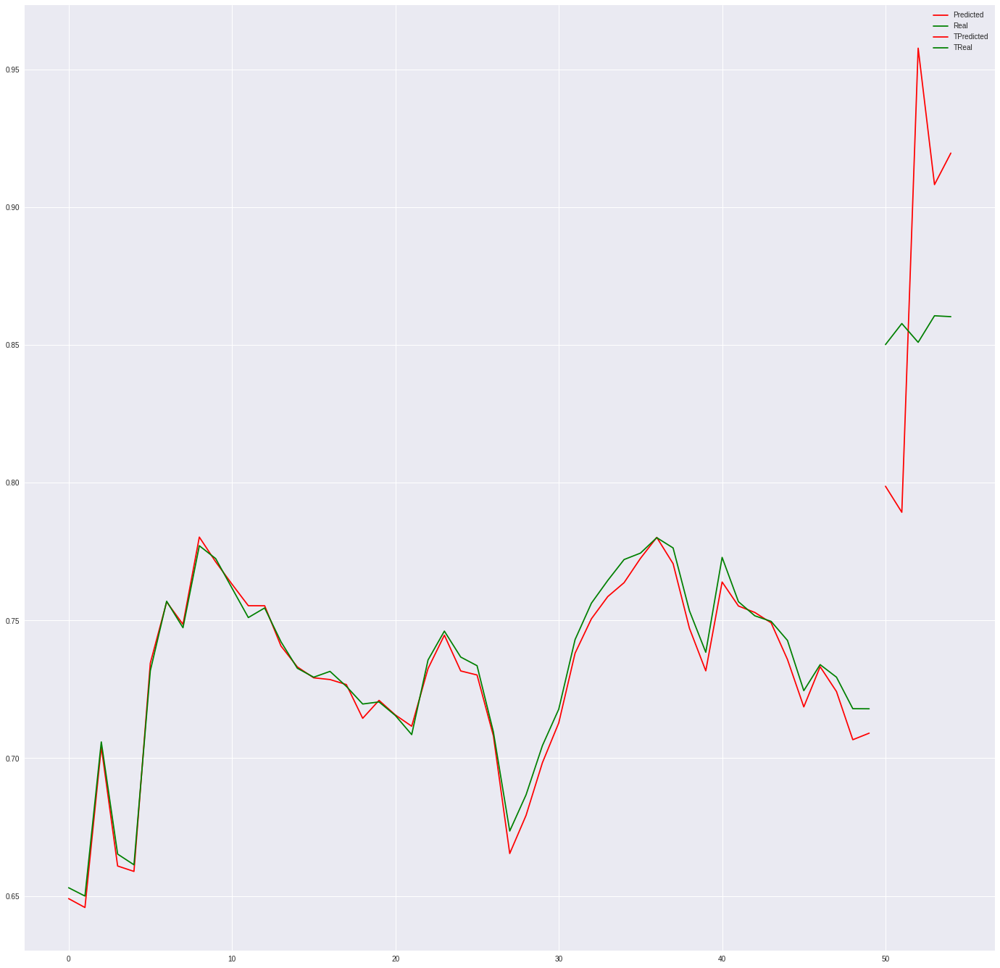

...

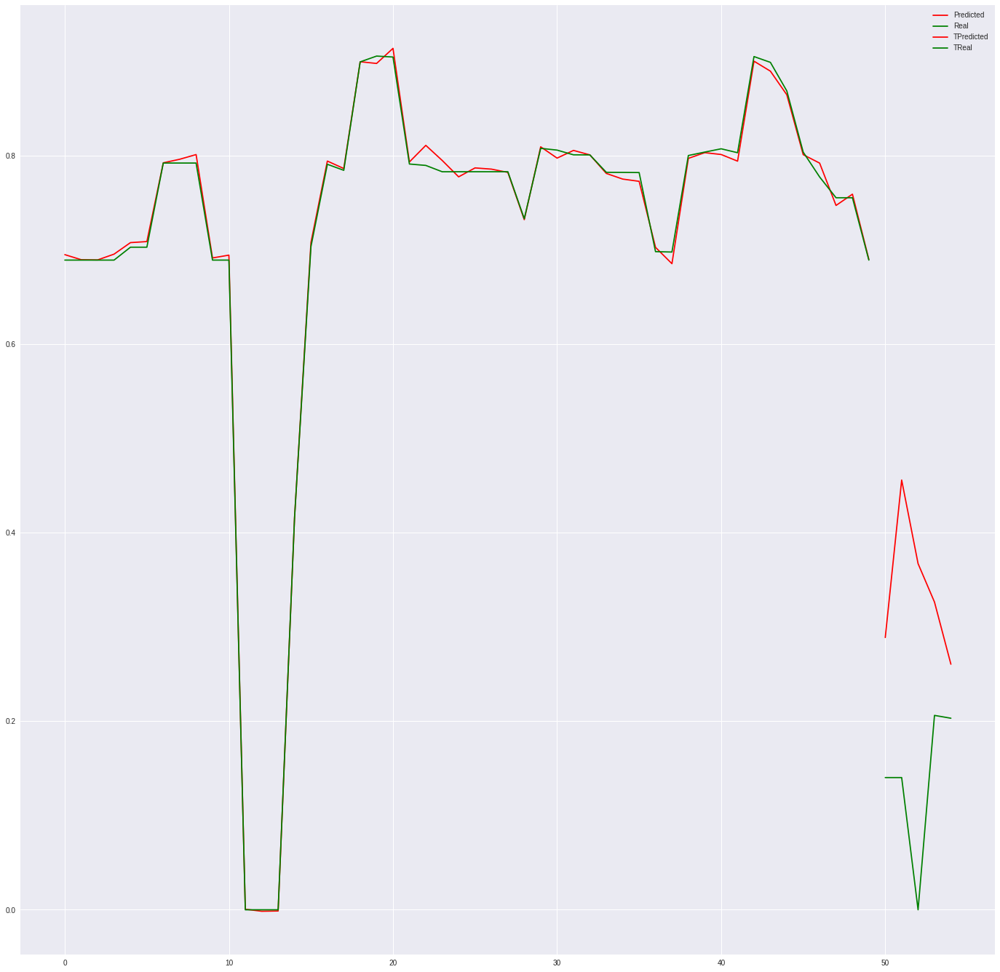

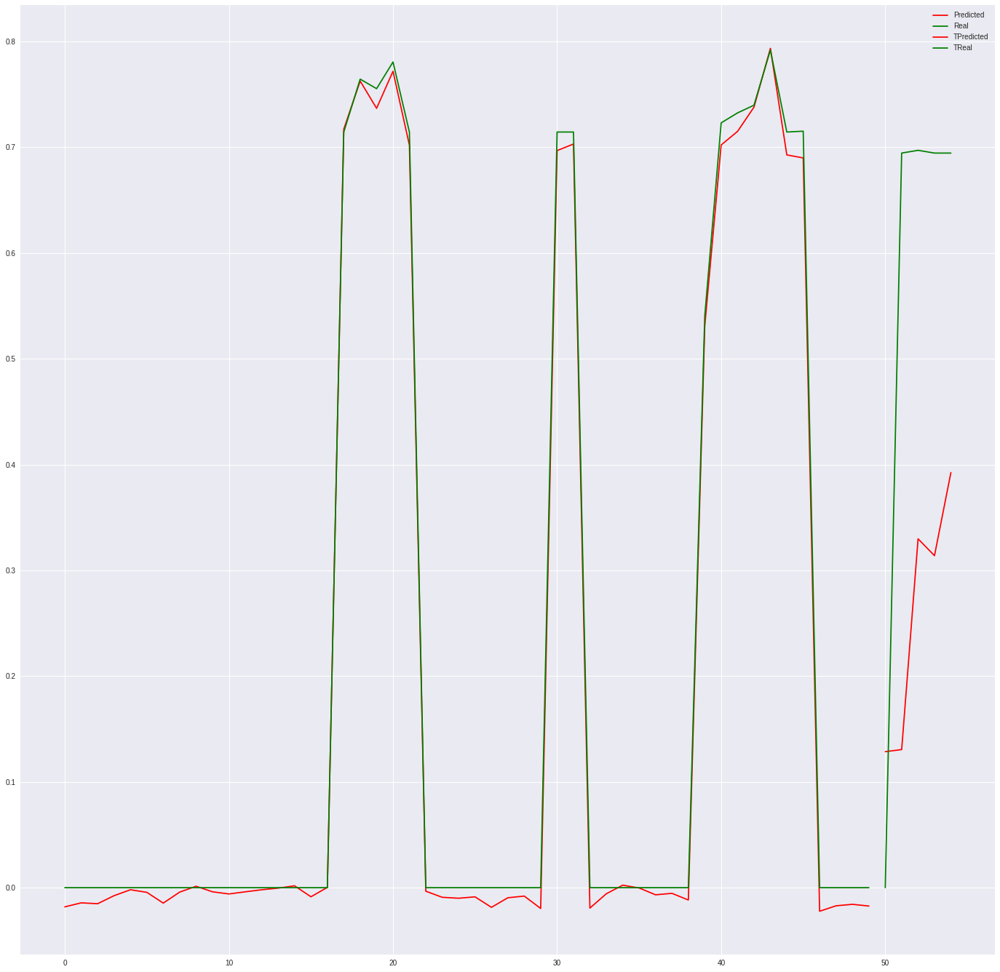

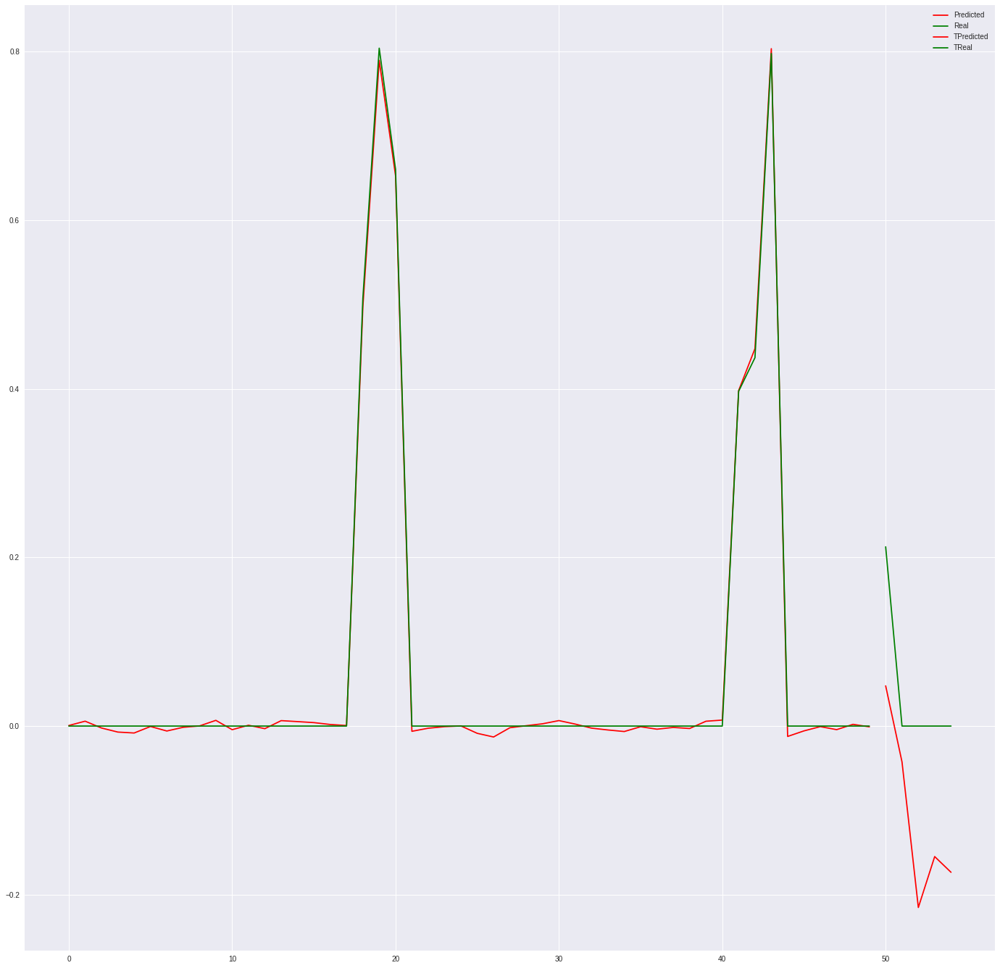

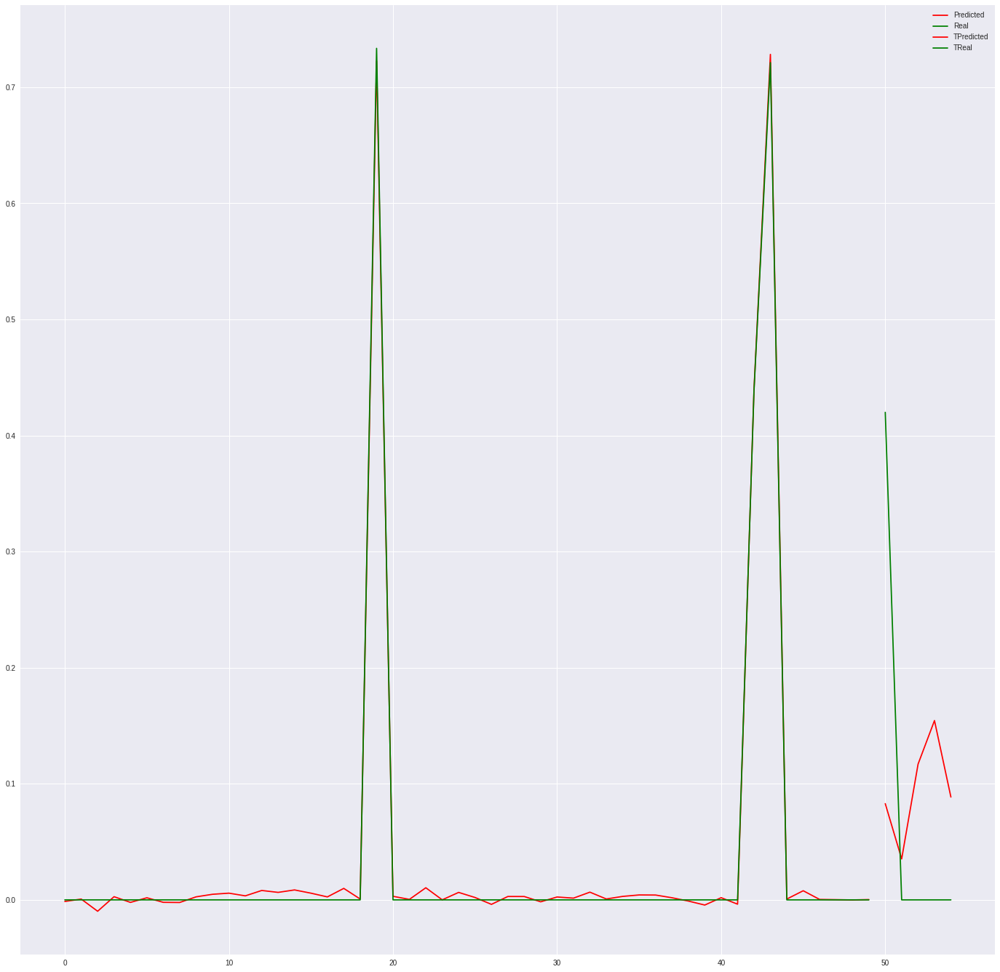

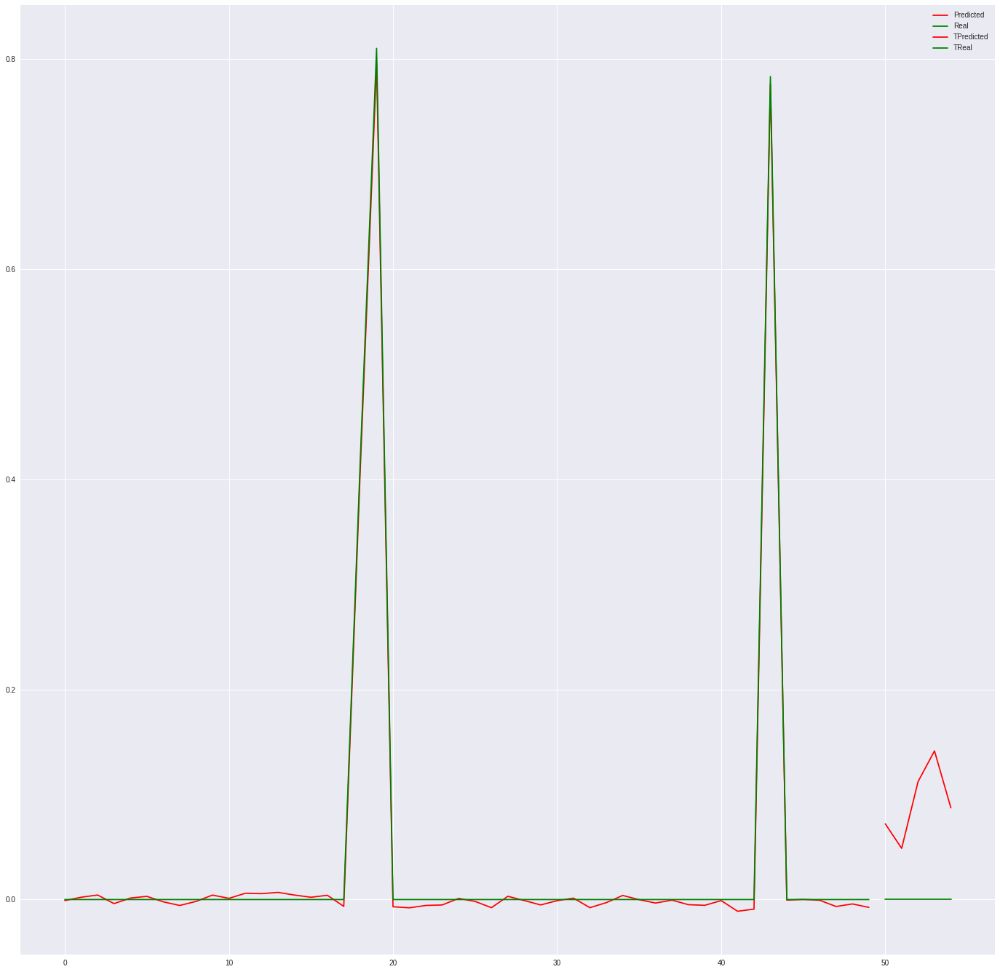

In [0]:
for target_feature in range(y.shape[1]):
    ypt = unwind_y(model2.predict(Xt[:5], verbose=0), target_feature)
    yrt = unwind_y(yt[:5],target_feature)


    yp = unwind_y(model2.predict(X[50:100], verbose=0),target_feature)
    yr = unwind_y(y[50:100],target_feature)

    %matplotlib inline
    plt.figure(figsize=(24,24))
    n=100

    multi=False
    if multi:
        for i in range(10):
            plt.plot(yp[i], color= 'red', label="Predicted")
            plt.plot(yr[i], color='green', label="Real")
    else:
        plt.plot(yp, color= 'red', label="Predicted")
        plt.plot(yr, color='green', label="Real")
        plt.plot(range(len(yp),len(yp)+len(ypt)),ypt,color="red", label="TPredicted")
        plt.plot(range(len(yp),len(yp)+len(yrt)),yrt,color="green",  label="TReal")

    #plt.plot(X[50:100,n_steps-1], color='blue', label="Lagged-0")
    #plt.plot(Xt[:5,n_steps-1], color='blue', label="Lagged-0")

    plt.legend()
    plt.show()

In [0]:
y_pred_test=model1.predict(Xt)
y_pred_test.shape
#len(yt[1])

yt_arr=np.array(yt)
res=y_pred_test - yt_arr.reshape(yt_arr.shape[0],yt_arr.shape[1])

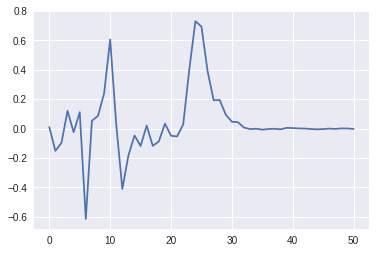

In [0]:
%matplotlib inline
plt.plot(res[0])

In [0]:
calc_rmse(model2, Xt, yt)
     

3422.028260002409